## DataMinining - Decision Tree

### 2018122007 변수현
#### 분석 목표 : 와인의 품질에 어떤 변수들이 영향을 미치는지 분석하고, 와인 품질에 대한 예측 모델 수립 
#### 데이터 : 와인의 품질에 관한 데이터. 
* Y변수 : 'quality' (0~10)
* x변수 : 총 11개 

#### 0. DATA input

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree

In [2]:
wine = pd.read_csv("winequality-red.csv")

In [3]:
len(wine)

1599

In [4]:
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [5]:
wine.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

#### 1. 분류의 목적으로 quality > 6.5인 경우에는 "good"이라고 하고 반대의 경우에는 "bad"로 변환하라 

In [6]:
wine.quality.unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [7]:
wine.quality = wine.quality.replace([7,8],'good')
wine.quality = wine.quality.replace([3,4,5,6],'bad')

In [8]:
wine.quality.unique()

array(['bad', 'good'], dtype=object)

#### 2. Training 데이터와 Test 데이터를 50:50의 비율로 분할하시오 (단, 시드번호는 학번의 뒤자리수 4개를 이용)

In [9]:
from sklearn.model_selection import train_test_split

X = wine.drop('quality',axis=1)
y = wine['quality']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=2007, stratify=y)

In [10]:
print(len(X_train))
print(len(X_test))
print(len(y_train))
print(len(y_test))

799
800
799
800


#### 3. Python 프로그램의 DecisionTreeClassifier 함수를 사용하여 의사결정나무를 수행하고자 한다. 단, hyper-parameter는 아래와 같이 조정한다. 
* min_sample_split = 20~200 (10의 간격으로) 
* min_impurity_decrease = 0.0 (고정)
* ccp_alpha= 0.0 ~ 0.01 (0.001의 간격으로)
* 그 외의 parameter 값들은 default 값을 사용 

In [11]:
min_sample_split = list(range(20,201,10))
ccp_alpha = [0.0,0.001,0.002,0.003,0.004,0.005,0.006,0.007,0.008,0.009,0.01]

In [12]:
DT_model = []
params = []
for i in min_sample_split:
    for j in ccp_alpha:
        DT = DecisionTreeClassifier(min_samples_split = i,
                                    min_impurity_decrease = 0.0, 
                                    ccp_alpha = j)
        params.append((i,j))
        DT_model.append(DT)

In [13]:
df = pd.DataFrame(params,columns = ["min_samples_split","ccp_alpha"])

In [14]:
df["model"] = DT_model

In [15]:
df

,min_samples_split,ccp_alpha,model
0,20,0.000,"DecisionTreeClassifier(ccp_alpha=0.0, class_we..."
1,20,0.001,"DecisionTreeClassifier(ccp_alpha=0.001, class_..."
2,20,0.002,"DecisionTreeClassifier(ccp_alpha=0.002, class_..."
3,20,0.003,"DecisionTreeClassifier(ccp_alpha=0.003, class_..."
4,20,0.004,"DecisionTreeClassifier(ccp_alpha=0.004, class_..."
...,...,...,...
204,200,0.006,"DecisionTreeClassifier(ccp_alpha=0.006, class_..."
205,200,0.007,"DecisionTreeClassifier(ccp_alpha=0.007, class_..."
206,200,0.008,"DecisionTreeClassifier(ccp_alpha=0.008, class_..."
207,200,0.009,"DecisionTreeClassifier(ccp_alpha=0.009, class_..."


#### 4. 위 3번의 조건에 맞는 209 (11*19) 개의 의사결정나무를 training 데이터를 이용하여 생성하고, test 데이터를  이용하여 예측 정확도를 계산하고자 한다. 이때 예측정확도는 AUROC값을 사용한다 (AUROC값은 패키지 함수 사용 가능)

* factor to number

In [16]:
y_train = y_train.replace("bad",0)
y_train = y_train.replace("good",1)

y_test = y_test.replace("bad",0)
y_test = y_test.replace("good",1)

* model fitting

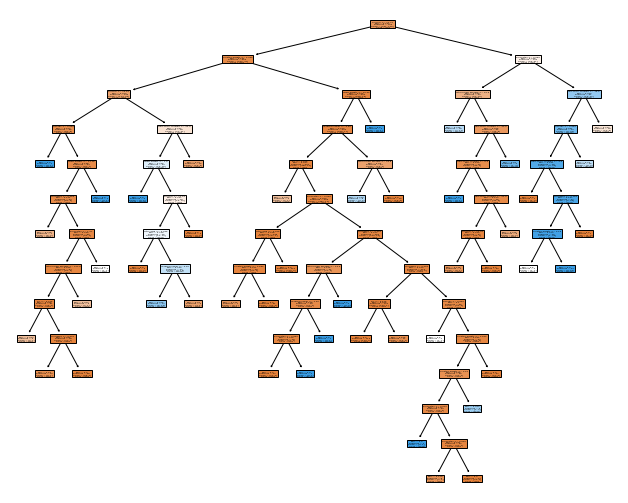

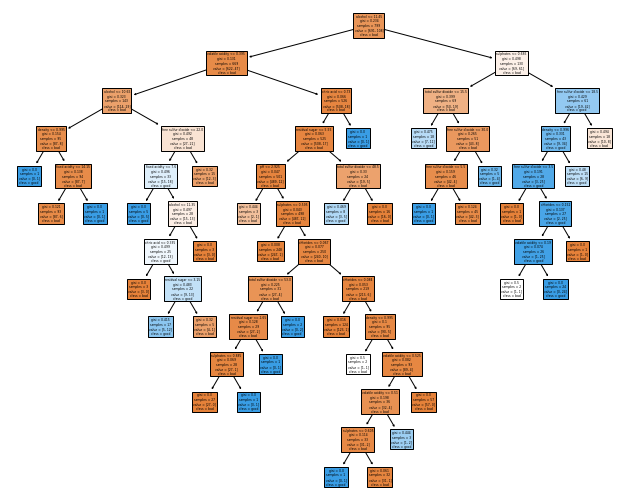

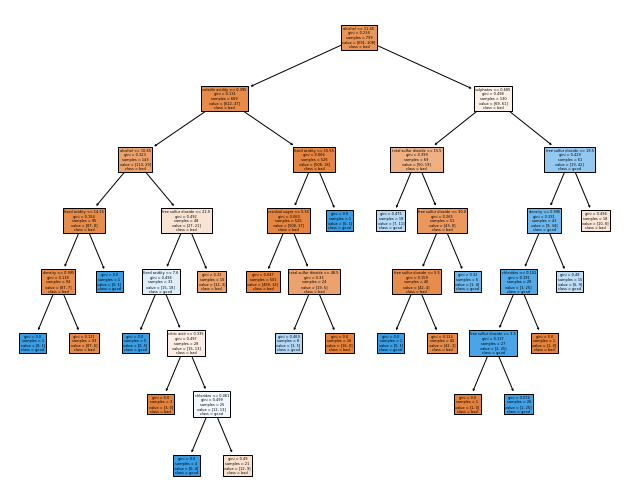

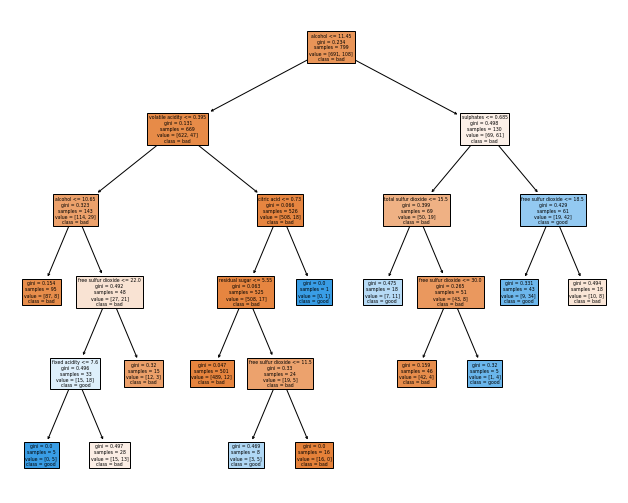

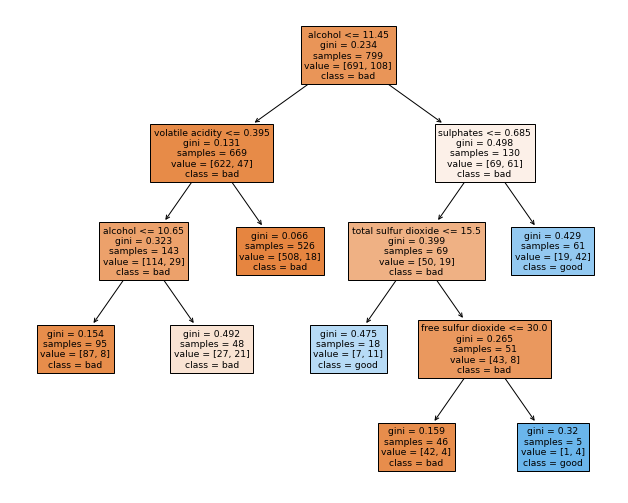

...

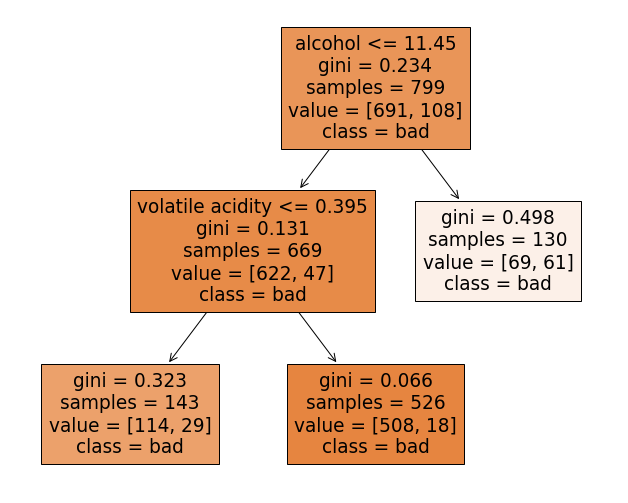

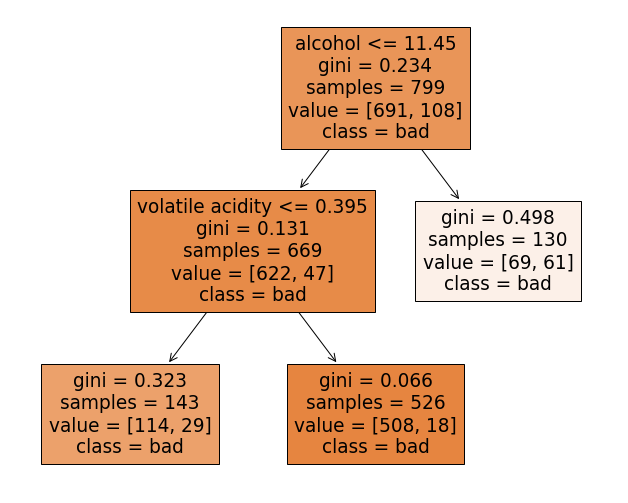

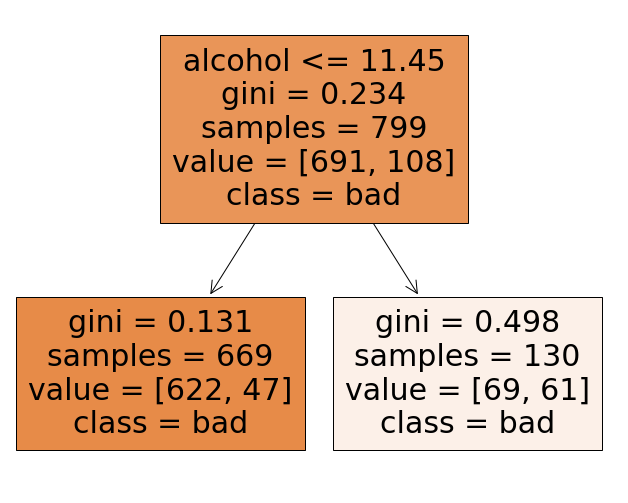

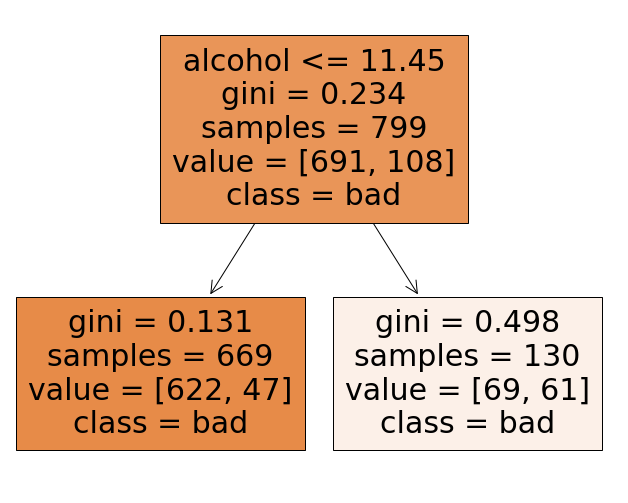

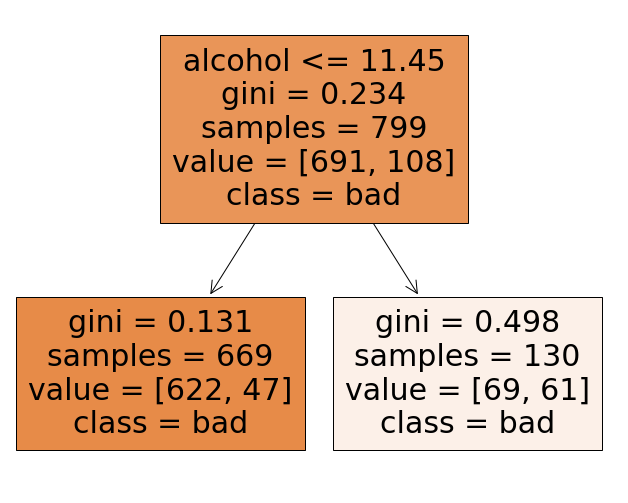

In [17]:
# Decision tree
DT_fit = []
for i in range(len(DT_model)):
    fit = DT_model[i].fit(X_train,y_train)
    plt.subplots(figsize = (11,9))
    plot_tree(fit,feature_names = X_train.columns,
              class_names = ["bad","good"],filled=True)
    plt.show()
    DT_fit.append(fit)

* predict testdata

In [18]:
from sklearn.metrics import roc_auc_score, roc_curve

DT_predict = [fit.predict(X_test) for fit in DT_fit]

In [19]:
auroc = [roc_auc_score(y_test,pred) for pred in DT_predict]

In [20]:
df["auroc"] = auroc

In [21]:
df.head()

,min_samples_split,ccp_alpha,model,auroc
0,20,0.000,"DecisionTreeClassifier(ccp_alpha=0.0, class_we...",0.713711
1,20,0.001,"DecisionTreeClassifier(ccp_alpha=0.001, class_...",0.712264
2,20,0.002,"DecisionTreeClassifier(ccp_alpha=0.002, class_...",0.682311
3,20,0.003,"DecisionTreeClassifier(ccp_alpha=0.003, class_...",0.671444
4,20,0.004,"DecisionTreeClassifier(ccp_alpha=0.004, class_...",0.695349


#### 5. 4번의 결과, 총 209개의 AUROC 값을 구할 수 있다. 이를 min_samples_split과 ccp_alpha값의 조합에 따라 AUROC값으로 3차원 포물선 그래프를 생성하시오 (3D surface plot)

In [22]:
from mpl_toolkits.mplot3d import axes3d

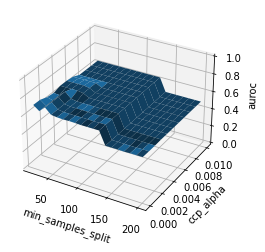

In [23]:
fig = plt.figure()
ax = fig.gca(projection = '3d')

x = np.array(df["min_samples_split"])
y = np.array(df["ccp_alpha"])
z = np.array(df["auroc"])

X = x.reshape(19,11)
Y = y.reshape(19,11)
Z = z.reshape(19,11)

ax.plot_surface(X,Y,Z)

ax.set_xlabel("min_samples_split")
ax.set_ylabel("ccp_alpha")
ax.set_zlabel("auroc")

ax.set_zlim(0,1)

plt.show()

#### 6. 5번의 결과에서 예측정확도가 가장 높은 최적의 hyper parameter 조합은 무엇인지 밝히시오 
* min_samples_spllit =40 , ccp_alpha = 0.003

In [24]:
df[df["auroc"]==max(df["auroc"])]

,min_samples_split,ccp_alpha,model,auroc
22,40,0.0,"DecisionTreeClassifier(ccp_alpha=0.0, class_we...",0.725056
